# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [2]:
%matplotlib inline

# Package to filter warnings
import warnings
warnings.filterwarnings("ignore")

# Data Loading and other standard packages
import sqlite3
import nltk
import string
import re
import pickle
import os
import time
import string
import pickle
import pandas as pd
import numpy as np
from scipy import interp
from tqdm import tqdm
from scipy.sparse import find
from wordcloud import WordCloud, STOPWORDS
from scipy.sparse import coo_matrix, vstack, hstack


# Plotting Packages
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz
import pydotplus

# Preprocessing packages
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler

# Packages related to text processing
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem.porter import PorterStemmer
from sklearn import decomposition
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from gensim.models import Word2Vec
from gensim.models import KeyedVectors

# Packages for performance metrics
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

# Packages for crossvalidation
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import KFold

# Model packages
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

In [3]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 5000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (5000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [4]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(4986, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

99.72

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(4986, 10)


1    4178
0     808
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [14]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[2500]
print(sent_4900)
print("="*50)

Why is this $[...] when the same product is available for $[...] here?<br />http://www.amazon.com/VICTOR-FLY-MAGNET-BAIT-REFILL/dp/B00004RBDY<br /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no 

In [15]:
print(display.shape)
display.head()

(2, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [16]:
display[display['UserId']=='AZY10LLTJ71NX']

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text


#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [17]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [18]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [19]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(4986, 10)

In [20]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

99.72

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [21]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [22]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [23]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(4986, 10)


1    4178
0     808
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [24]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[1500]
print(sent_4900)
print("="*50)

Why is this $[...] when the same product is available for $[...] here?<br />http://www.amazon.com/VICTOR-FLY-MAGNET-BAIT-REFILL/dp/B00004RBDY<br /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no 

In [25]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [26]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

Why is this $[...] when the same product is available for $[...] here? />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no idea what they were ordering; the other wants crispy cookies.  Hey, I'm sorry; b

In [27]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [28]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Wow.  So far, two two-star reviews.  One obviously had no idea what they were ordering; the other wants crispy cookies.  Hey, I am sorry; but these reviews do nobody any good beyond reminding us to look  before ordering.<br /><br />These are chocolate-oatmeal cookies.  If you do not like that combination, do not order this type of cookie.  I find the combo quite nice, really.  The oatmeal sort of "calms" the rich chocolate flavor and gives the cookie sort of a coconut-type consistency.  Now let is also remember that tastes differ; so, I have given my opinion.<br /><br />Then, these are soft, chewy cookies -- as advertised.  They are not "crispy" cookies, or the blurb would say "crispy," rather than "chewy."  I happen to like raw cookie dough; however, I do not see where these taste like raw cookie dough.  Both are soft, however, so is this the confusion?  And, yes, they stick together.  Soft cookies tend to do that.  They are not individually wrapped, which would add to the cost.  Oh y

In [29]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor  and  traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [30]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Wow So far two two star reviews One obviously had no idea what they were ordering the other wants crispy cookies Hey I am sorry but these reviews do nobody any good beyond reminding us to look before ordering br br These are chocolate oatmeal cookies If you do not like that combination do not order this type of cookie I find the combo quite nice really The oatmeal sort of calms the rich chocolate flavor and gives the cookie sort of a coconut type consistency Now let is also remember that tastes differ so I have given my opinion br br Then these are soft chewy cookies as advertised They are not crispy cookies or the blurb would say crispy rather than chewy I happen to like raw cookie dough however I do not see where these taste like raw cookie dough Both are soft however so is this the confusion And yes they stick together Soft cookies tend to do that They are not individually wrapped which would add to the cost Oh yeah chocolate chip cookies tend to be somewhat sweet br br So if you wa

In [31]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [32]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|████████████████████████████████████████████████████████████████████████████| 4986/4986 [00:02<00:00, 2146.56it/s]


In [33]:
print("Data Length: ",len(preprocessed_reviews))

Data Length:  4986


In [34]:
def pickle_data(file_name, data_object):
    f_obj = open(file_name,'wb')
    pickle.dump(data_object, f_obj)
    f_obj.close()

def unpickle_data(file_name):
    f_obj = open(file_name,'rb')
    data_object = pickle.load(f_obj)
    f_obj.close()
    
    return data_object

In [35]:
pickle_data('agglomerative_dbscan_dataset.pkl',preprocessed_reviews)

In [36]:
preprocessed_reviews = unpickle_data('agglomerative_dbscan_dataset.pkl')

# [4] Featurization

## [4.1] BAG OF WORDS

In [37]:
def bag_of_words_fit(data, min_df,max_features):
    count_vect = CountVectorizer(min_df=min_df, max_features=max_features)
    count_vect.fit(data)
    print("some feature names ", count_vect.get_feature_names()[:10])
    print('='*50)
    
    return count_vect
    
def bag_of_words_transform(vectorizer, data):
    final_counts = vectorizer.transform(data)
    print("the type of count vectorizer ",type(final_counts))
    print("the shape of out text BOW vectorizer ",final_counts.get_shape())
    print("the number of unique words ", final_counts.get_shape()[1])
    
    return final_counts

## [4.2] TF-IDF

In [38]:
def tf_idf_vector_fit(data, ngram, min_df, max_features):
    tf_idf_vect = TfidfVectorizer(ngram_range=ngram, min_df=min_df, max_features=max_features)
    tf_idf_vect.fit(data)
    print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
    print('='*50)
    
    return tf_idf_vect
    
def tf_idf_vector_transform(vectorizer, data):
    final_tf_idf = vectorizer.transform(data)
    print("the type of count vectorizer ",type(final_tf_idf))
    print("the shape of out text TFIDF vectorizer ",final_tf_idf.get_shape())
    print("the number of unique words including both unigrams and bigrams ", final_tf_idf.get_shape()[1])
    
    return final_tf_idf

## [4.3.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.3.1.1] Avg W2v

In [39]:
def avg_w2vec_model(corpus, min_count, size, workers):
    i=0
    list_of_sentance=[]
    for sentance in corpus:
        list_of_sentance.append(sentance.split())

    # Applying to W2V model on text corpus
    w2v_model=Word2Vec(list_of_sentance,min_count=min_count,size=size, workers=workers)
    w2v_words = list(w2v_model.wv.vocab)

    # compute average word2vec for each review.
    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sentance): # for each review/sentence
        sent_vec = np.zeros(size) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)
    print(len(sent_vectors))
    print(len(sent_vectors[0]))
    
    return list_of_sentance, sent_vectors

#### [4.3.1.2] TFIDF weighted W2v

In [40]:
def tfidf_w2vec_model(corpus, min_count, size, workers):
    list_of_sentance=[]
    for sentance in corpus:
        list_of_sentance.append(sentance.split())

    # Applying to W2V model on text corpus
    w2v_model=Word2Vec(list_of_sentance,min_count=min_count,size=size, workers=workers)
    w2v_words = list(w2v_model.wv.vocab)
    model = TfidfVectorizer()
    tf_idf_matrix = model.fit_transform(corpus)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
    # TF-IDF weighted Word2Vec for Train data
    tfidf_feat = model.get_feature_names() # tfidf words/col-names
    # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in tqdm(list_of_sentance): # for each review/sentence 
        sent_vec = np.zeros(size) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
    #             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
                # to reduce the computation we are 
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1
        
    return list_of_sentance, tfidf_sent_vectors

## Getting the vectorized data

In [41]:
print(50*'*','BOW',50*'*')
vectorizer = bag_of_words_fit(preprocessed_reviews, 5, None)
with open('bow_vectorizer_agglo_dbscan.pkl', 'wb') as obj:
    pickle.dump(vectorizer, obj)
bow = bag_of_words_transform(vectorizer, preprocessed_reviews)
print(50*'*','TFIDF',50*'*')
vectorizer = tf_idf_vector_fit(preprocessed_reviews, (1,2), 5, None)
with open('tfidf_vectorizer_agglo_dbscan.pkl', 'wb') as obj:
    pickle.dump(vectorizer, obj)
tfidf = tf_idf_vector_transform(vectorizer, preprocessed_reviews)

print(50*'*','AVG W2VEC',50*'*')
list_of_sentance, avg_w2vec = avg_w2vec_model(preprocessed_reviews, 10, 50, 4)
with open('avg_w2vec_list_of_sentance_agglo_dbscan.pkl', 'wb') as obj:
    pickle.dump(list_of_sentance, obj)

print(50*'*','TFIDF W2VEC',50*'*')
list_of_sentance, tfidf_w2vec = tfidf_w2vec_model(preprocessed_reviews, 10, 50, 4)
with open('tfidf_w2vec_list_of_sentance_agglo_dbscan.pkl', 'wb') as obj:
    pickle.dump(list_of_sentance, obj)


************************************************** BOW **************************************************
some feature names  ['ability', 'able', 'absolute', 'absolutely', 'absorb', 'acai', 'acceptable', 'accessible', 'accident', 'accidentally']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (4986, 3561)
the number of unique words  3561
************************************************** TFIDF **************************************************
some sample features(unique words in the corpus) ['ability', 'able', 'able buy', 'able find', 'able get', 'able make', 'able order', 'able purchase', 'able use', 'absolute']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (4986, 6642)
the number of unique words including both unigrams and bigrams  6642
************************************************** AVG W2VEC **************************************************


100%|████████████████████████████████████████████████████████████████████████████| 4986/4986 [00:04<00:00, 1084.45it/s]


4986
50
************************************************** TFIDF W2VEC **************************************************


100%|█████████████████████████████████████████████████████████████████████████████| 4986/4986 [00:27<00:00, 180.38it/s]


## Pickle/Unpickle data Function

In [42]:
file_names = ['bow_agglo_dbscan.pkl','tfidf_agglo_dbscan.pkl','avg_w2v_agglo_dbscan.pkl','tfidf_w2v_agglo_dbscan.pkl']
data_objects = [bow, tfidf, avg_w2vec, tfidf_w2vec]

for i in zip(file_names, data_objects):
    pickle_data(i[0], i[1])

## Defining Functions

In [43]:
#defining function to apply K Means cluster
def apply_kmeans_clustering(x, n_clusters):    
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(x)
    return kmeans

In [45]:
#defining function to apply agglomerative cluster
def apply_agglomerative_clustering(x, n_clusters):    
    agglo = AgglomerativeClustering(n_clusters=n_clusters).fit(x)
    return agglo

In [46]:
# Define Function to plot AUC vs alpha curve
def plot_elbow_curve(hyper_param, metric, title, xlab, ylab):
    plt.title(title)
    plt.plot(hyper_param, metric)
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    plt.show()

In [47]:
# Define function to Plot the ROC curve
def plot_roc_curve_for_test(fpr, tpr,fpr_train, tpr_train, title):
    plt.title(title)
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r')
    plt.plot(fpr, tpr, color='b')
    plt.plot(fpr_train, tpr_train, color='g')
    plt.legend(('No Prediction', 'Test', 'Train'))
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.show()

In [48]:
# Define function to standardize data
def perform_standardization(x_train, x_test):
    if (type(x_train).__name__ == 'csr_matrix') and (type(x_test).__name__ == 'csr_matrix'):
        scaler = MaxAbsScaler().fit(x_train)
        x_train_std = scaler.transform(x_train)
        x_test_std = scaler.transform(x_test)
        return x_train_std, x_test_std
    elif (type(x_train).__name__ == 'coo_matrix') and (type(x_test).__name__ == 'coo_matrix'):
        scaler = MaxAbsScaler().fit(x_train)
        x_train_std = scaler.transform(x_train)
        x_test_std = scaler.transform(x_test)
        return x_train_std, x_test_std
    else:
        scaler = StandardScaler().fit(x_train)
        x_train_std = scaler.transform(x_train)
        x_test_std = scaler.transform(x_test)
        return x_train_std, x_test_std

In [49]:
# Define function for word cloud
def create_word_cloud(data,font_sz, fig_size):
    plt.figure(figsize=fig_size)

    stopwords = set(STOPWORDS)
    wordcloud = WordCloud(
            background_color='white',
            stopwords=stopwords,
            max_words=200,
            max_font_size=font_sz, 
            scale=3,
            random_state=1
        ).generate(str(data))
    plt.imshow(wordcloud)
    plt.show()

## [5.1] K-Means Clustering

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [ ]:
%time
x=unpickle_data('bow.pkl')
inertia = []
k_val = []
for k in range(1,20):
    print('Cluster: {}'.format(k))
    kmeans = apply_kmeans_clustering(x,k)
    k_val.append(k)
    inertia.append(kmeans.inertia_)

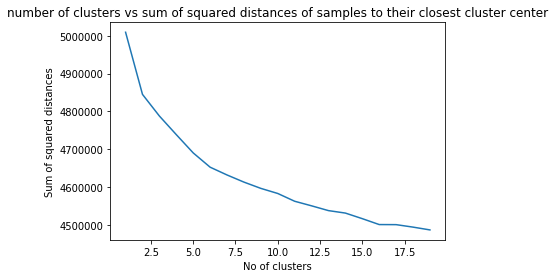

In [144]:
plot_elbow_curve(k_val, inertia, 'number of clusters vs sum of squared distances of samples to their closest cluster center','No of clusters', 'Sum of squared distances')

### From the above elbow curve we can take the number of clusters to be 10 as the metric doesn't vary too much after 10

In [6]:
# apply kemans with k=10
optimal_kmeans = KMeans(n_clusters=10)
optimal_kmeans.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [20]:
# get the index position of 20 words from each cluster
data_dict = {}
for k in range(0,10):
    data_dict[k] = np.where(optimal_kmeans.labels_ == k)[0][:20]

In [22]:
# get the BoW feature names
bow_features=unpickle_data('bow_vectorizer.pkl').get_feature_names()

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

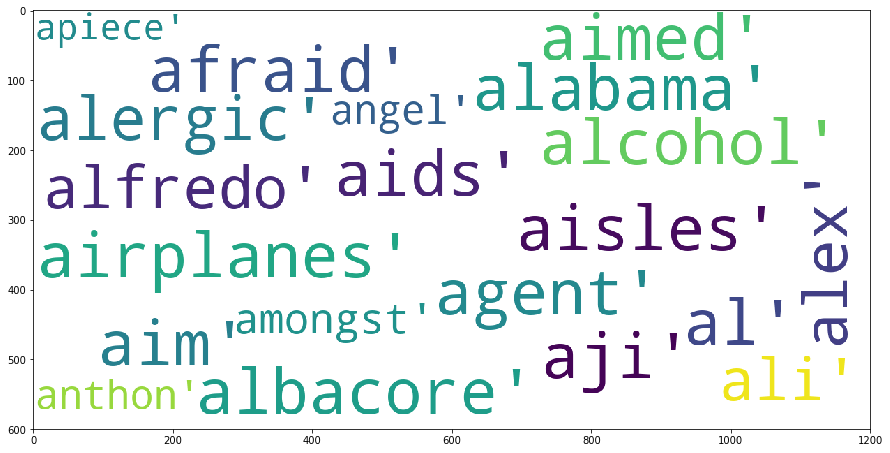

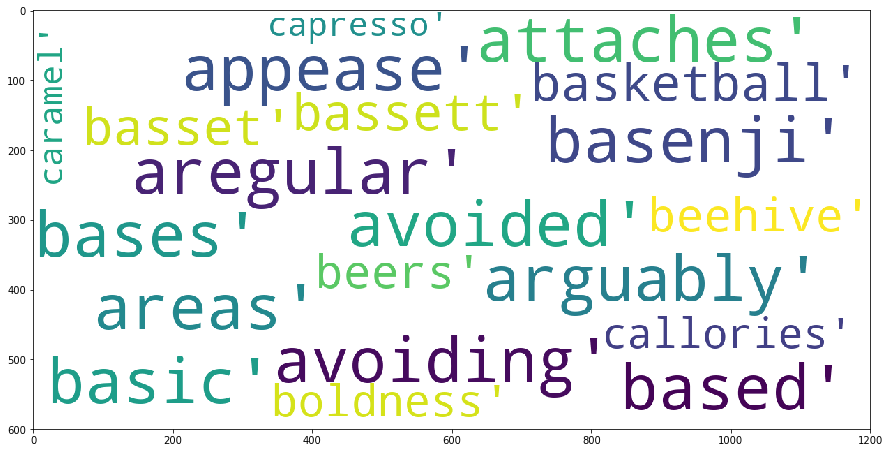

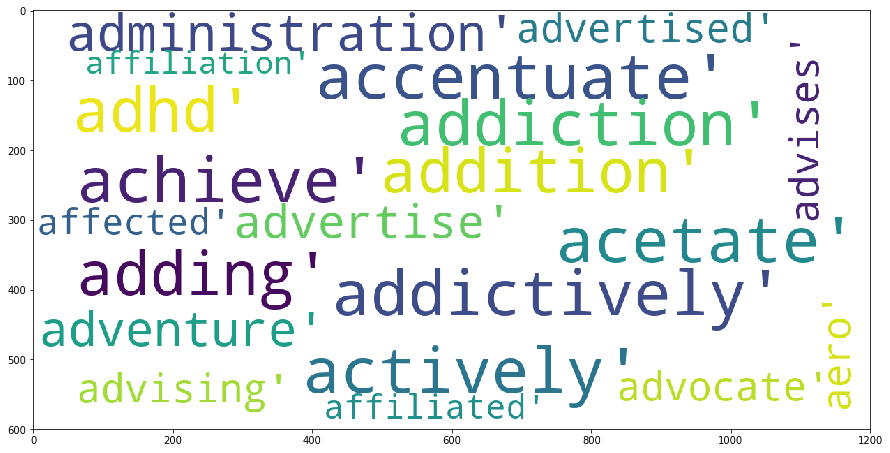

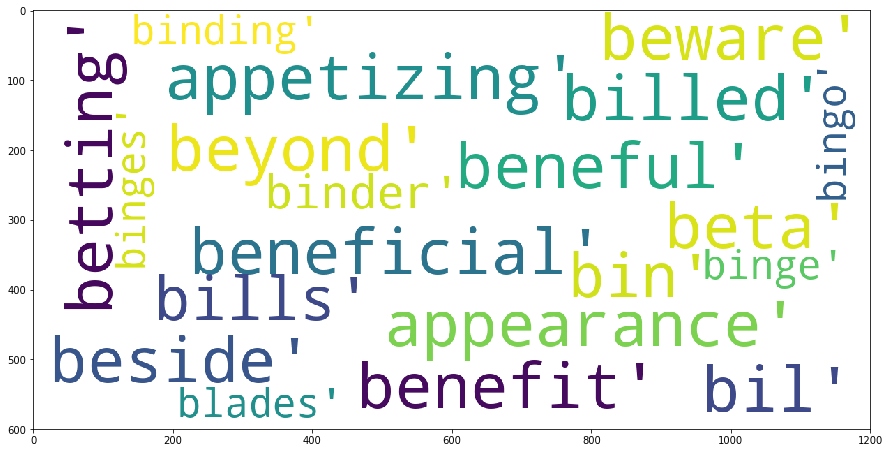

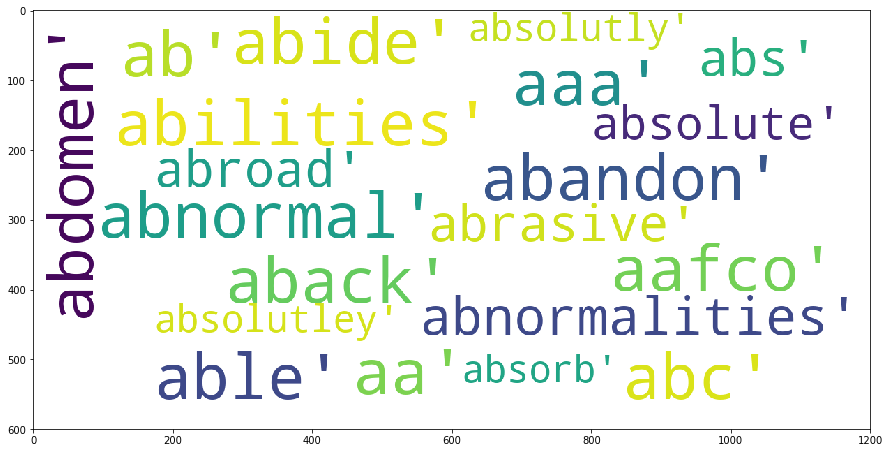

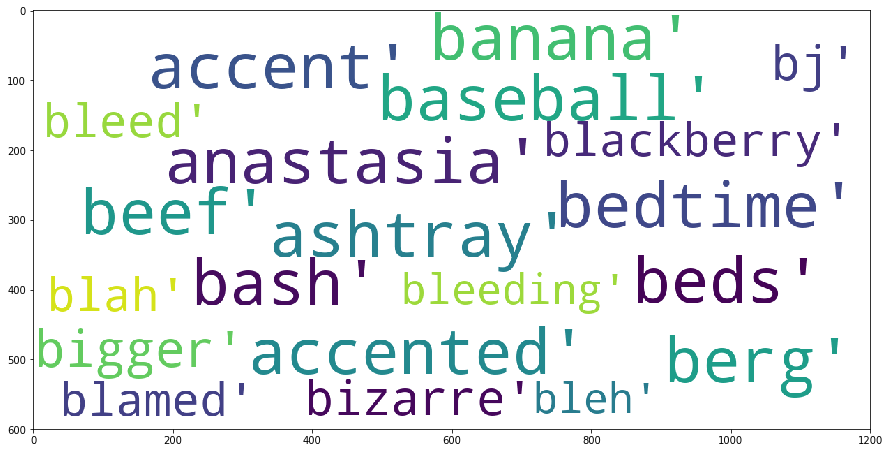

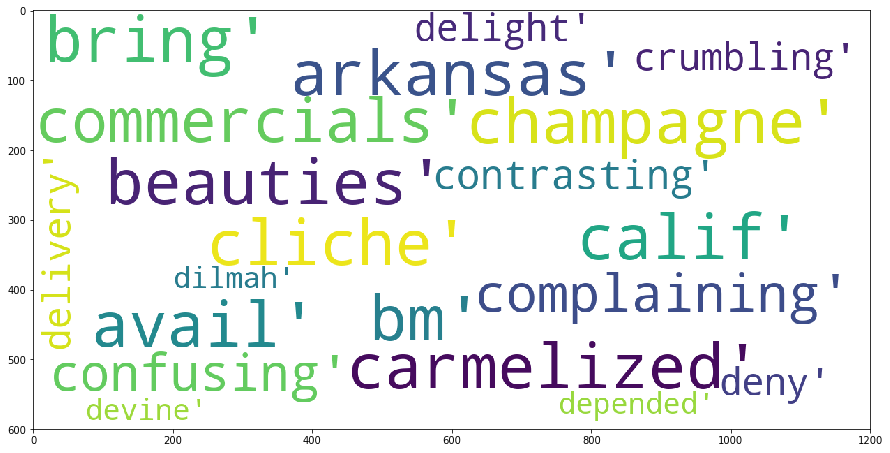

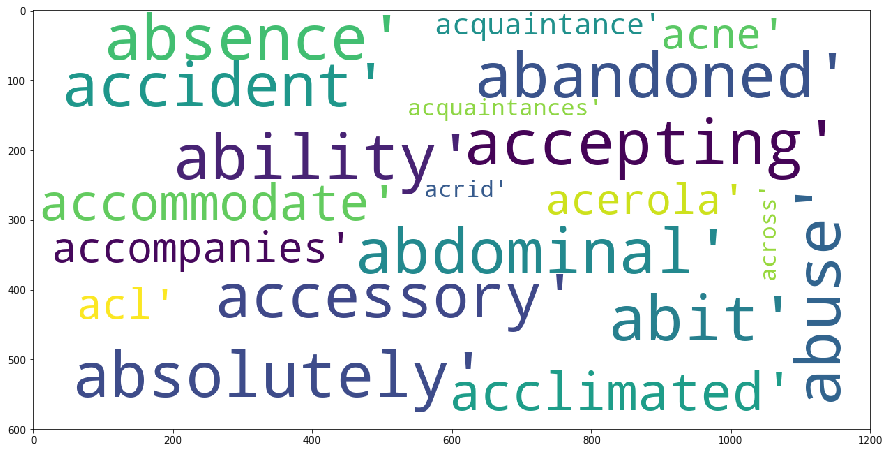

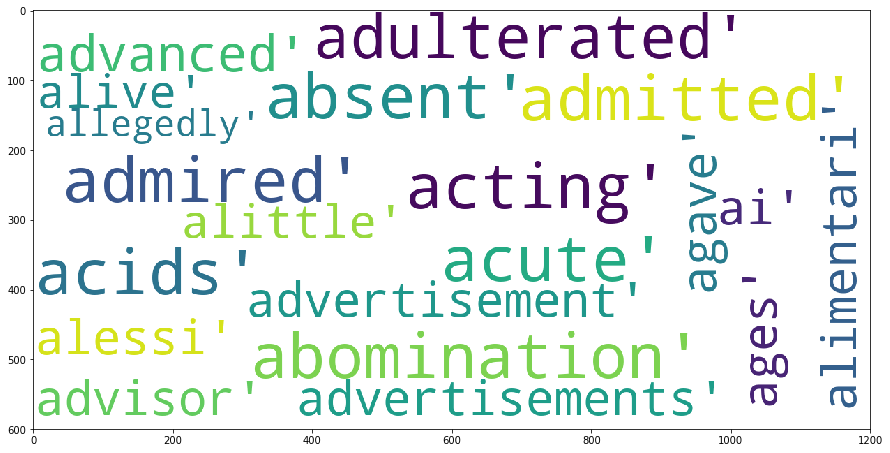

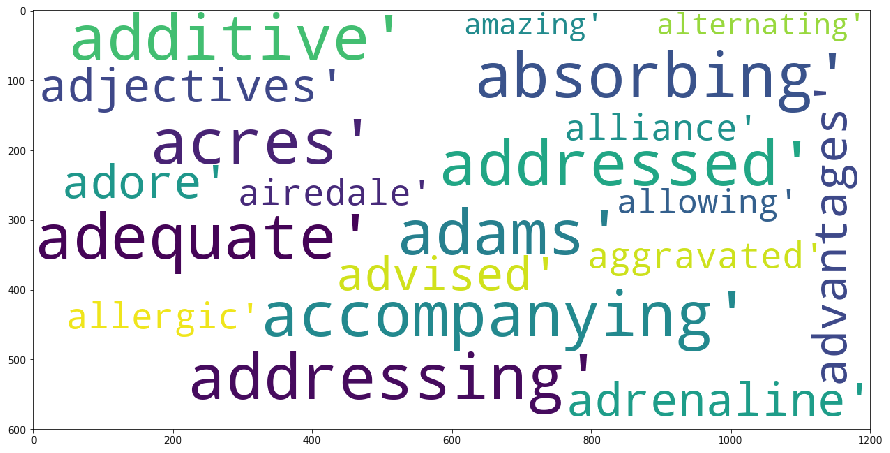

In [28]:
for k in range(0,10):
    create_word_cloud(np.array(bow_features)[data_dict[k]],30,(15,8))

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [ ]:
%time
x=unpickle_data('tfidf.pkl')
inertia = []
k_val = []
for k in range(1,20):
    print('Cluster: {}'.format(k))
    kmeans = apply_kmeans_clustering(x,k)
    k_val.append(k)
    inertia.append(kmeans.inertia_)

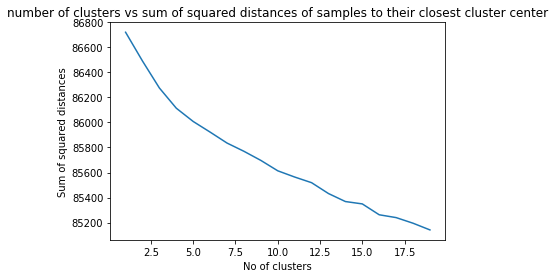

In [34]:
plot_elbow_curve(k_val, inertia, 'number of clusters vs sum of squared distances of samples to their closest cluster center','No of clusters', 'Sum of squared distances')

### From the above elbow curve we can take the number of clusters to be 15 as the metric doesn't vary too much after 15

In [35]:
# apply kemans with k=15
optimal_kmeans = KMeans(n_clusters=15)
optimal_kmeans.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [36]:
# get the index position of 20 words from each cluster
data_dict = {}
for k in range(0,15):
    data_dict[k] = np.where(optimal_kmeans.labels_ == k)[0][:20]

In [38]:
# get the BoW feature names
tfidf_features=unpickle_data('tfidf_vectorizer.pkl').get_feature_names()

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

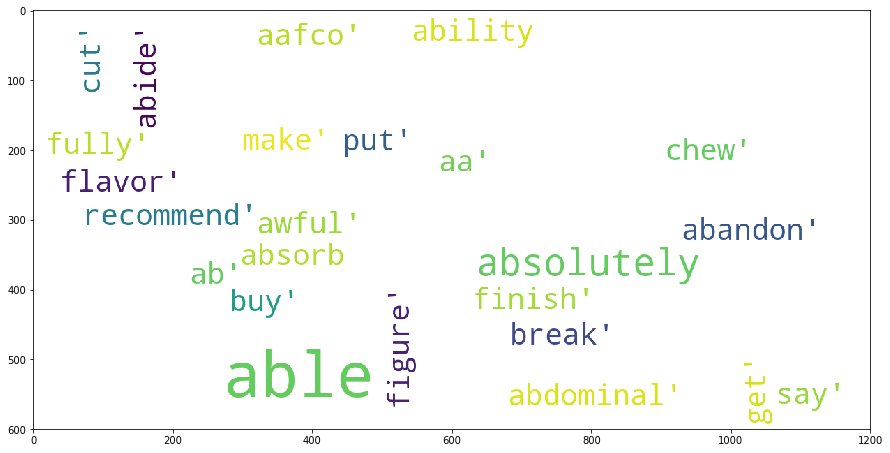

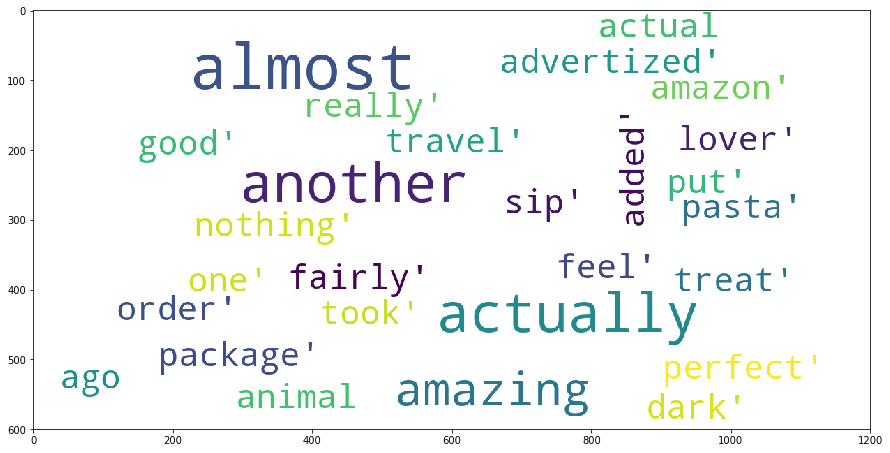

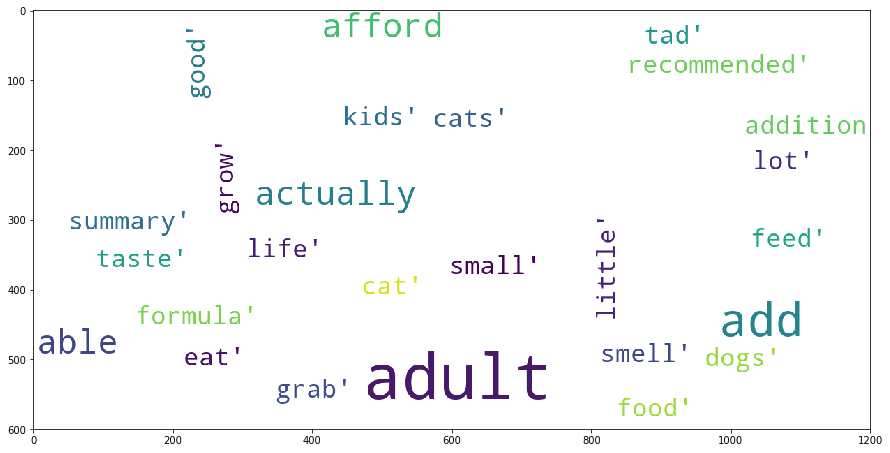

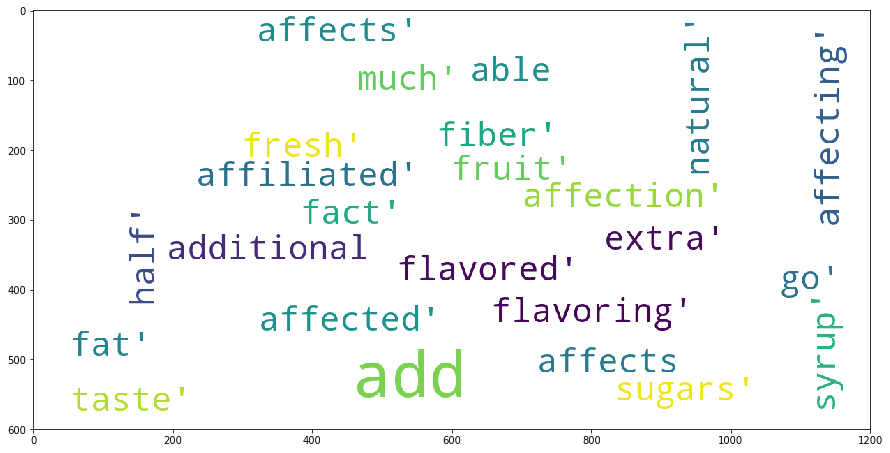

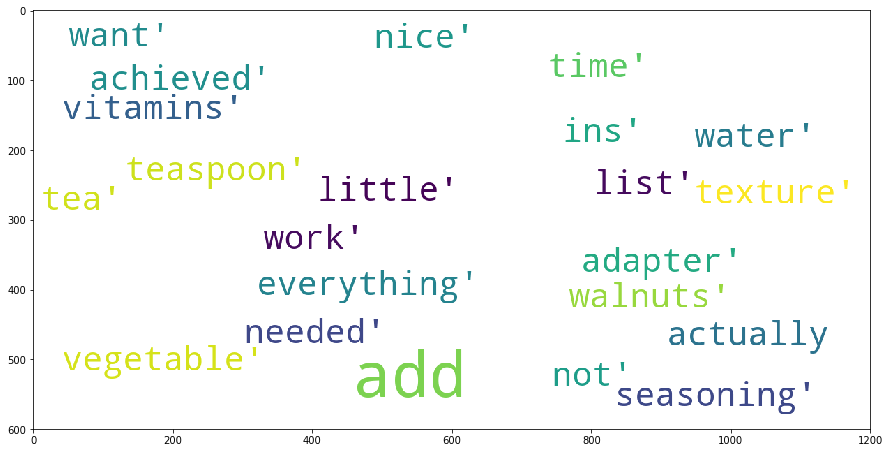

...

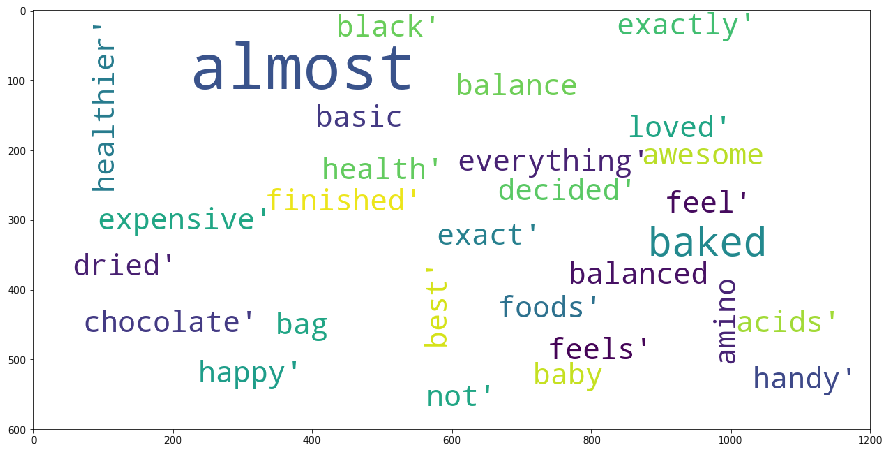

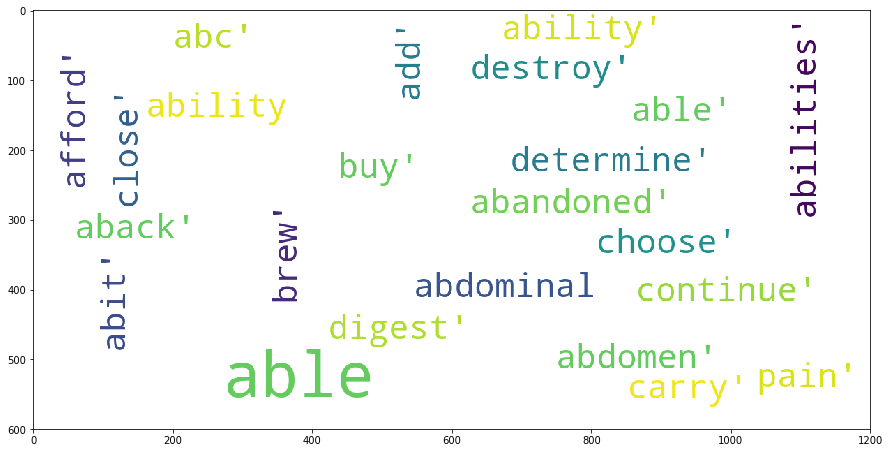

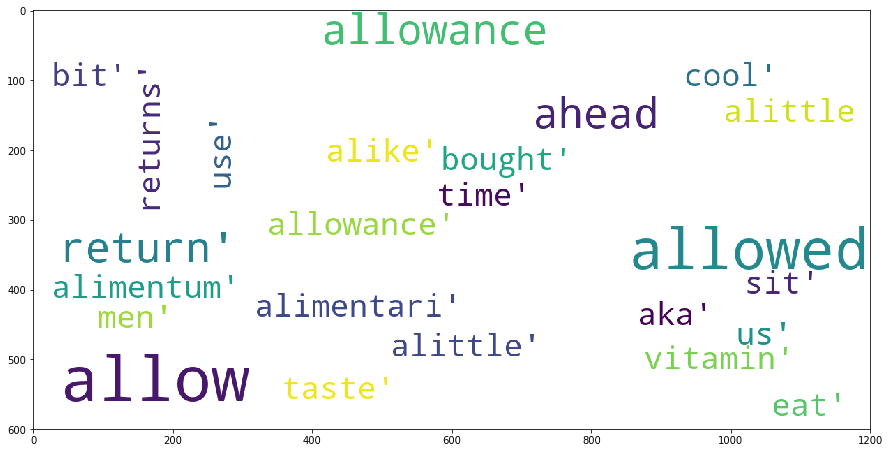

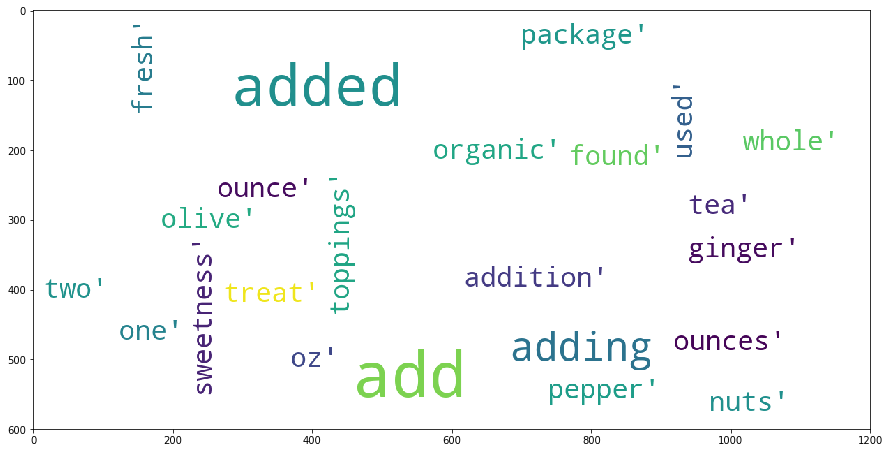

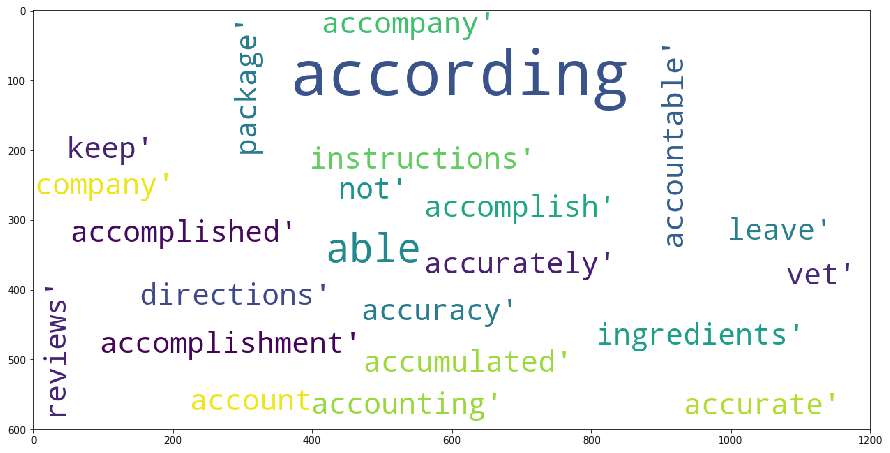

In [39]:
for k in range(0,15):
    create_word_cloud(np.array(tfidf_features)[data_dict[k]],30,(15,8))

## [5.3] Applying KMeans on AVG W2V,<font color='red'> SET 3</font>

In [55]:
%time
# Unpickle AVG W2Vec Data
x = unpickle_data('tfidf_w2v.pkl')
inertia = []
k_val = []
for k in range(1,20):
    print('Cluster: {}'.format(k))
    kmeans = apply_kmeans_clustering(x,k)
    k_val.append(k)
    inertia.append(kmeans.inertia_)

Wall time: 0 ns
Cluster: 1
Cluster: 2
Cluster: 3
Cluster: 4
Cluster: 5
Cluster: 6
Cluster: 7
Cluster: 8
Cluster: 9
Cluster: 10
Cluster: 11
Cluster: 12
Cluster: 13
Cluster: 14
Cluster: 15
Cluster: 16
Cluster: 17
Cluster: 18
Cluster: 19


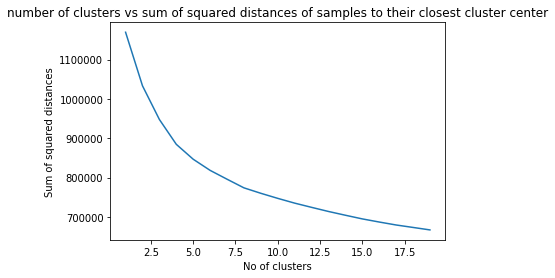

In [56]:
plot_elbow_curve(k_val, inertia, 'number of clusters vs sum of squared distances of samples to their closest cluster center','No of clusters', 'Sum of squared distances')

### From the above elbow curve we can take the number of clusters to be 10 as the metric doesn't vary too much after 10

In [57]:
# apply kemans with k=10
optimal_kmeans = KMeans(n_clusters=10)
optimal_kmeans.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [58]:
# get the index position of 20 words from each cluster
data_dict = {}
for k in range(0,10):
    data_dict[k] = np.where(optimal_kmeans.labels_ == k)[0][:20]

In [59]:
# get the BoW feature names
tfidf_w2vec_list_of_sentance=unpickle_data('tfidf_w2vec_list_of_sentance.pkl')

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

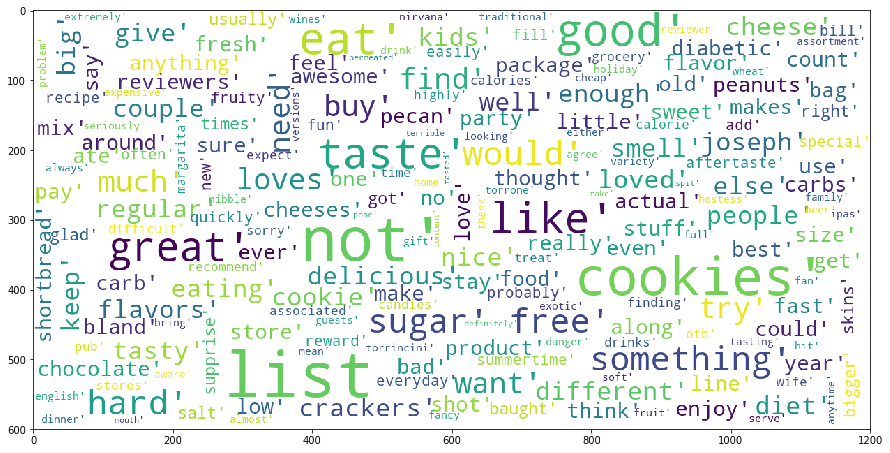

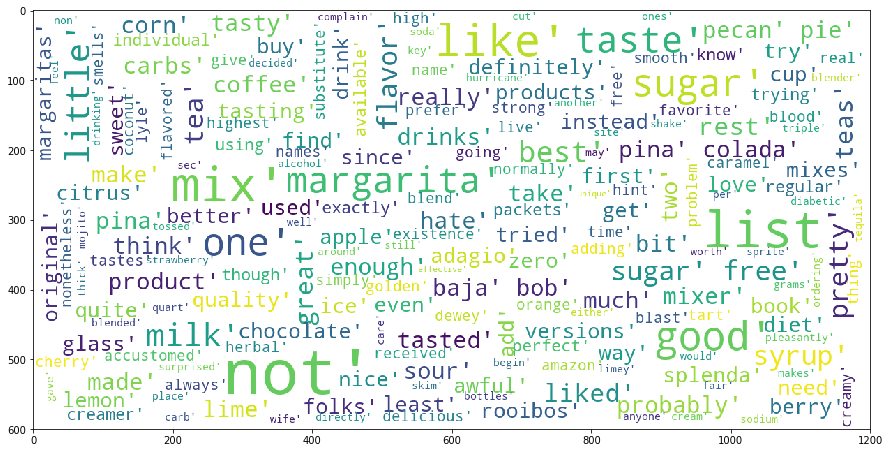

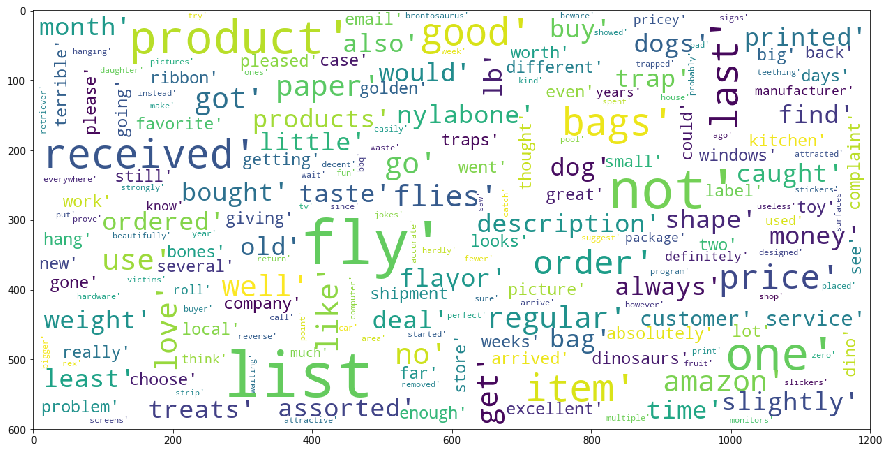

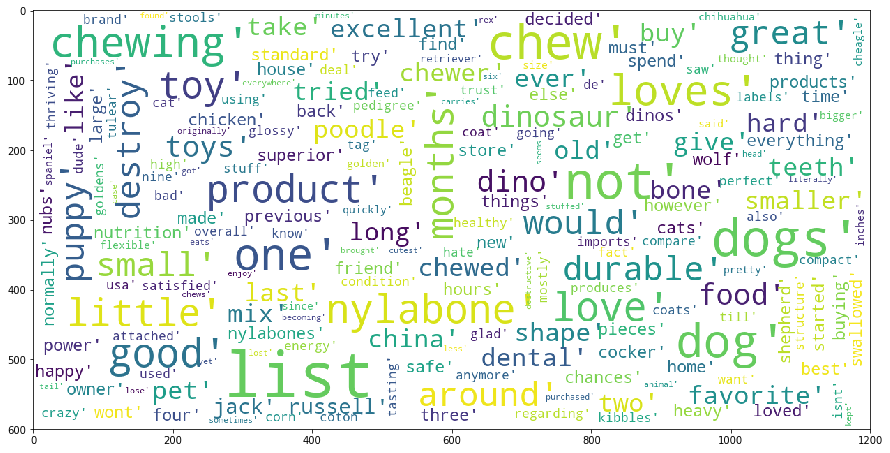

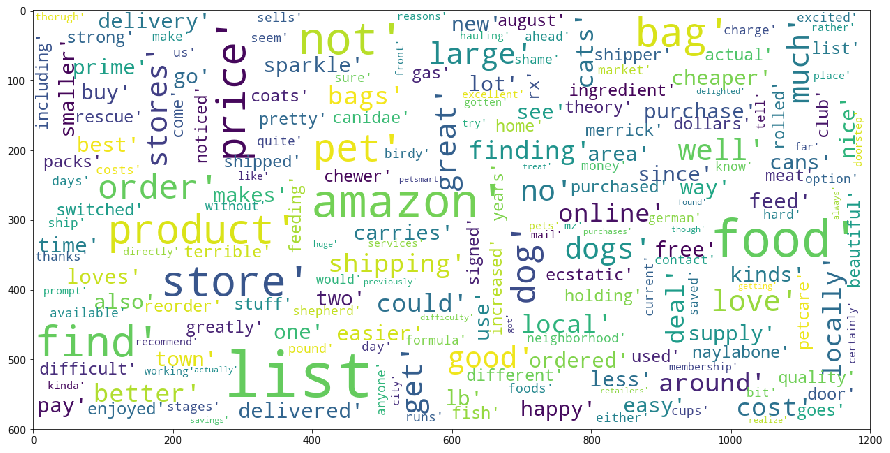

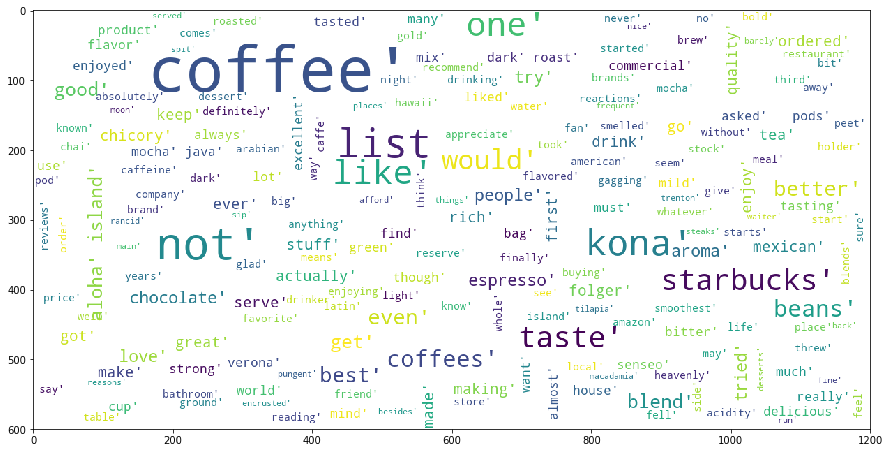

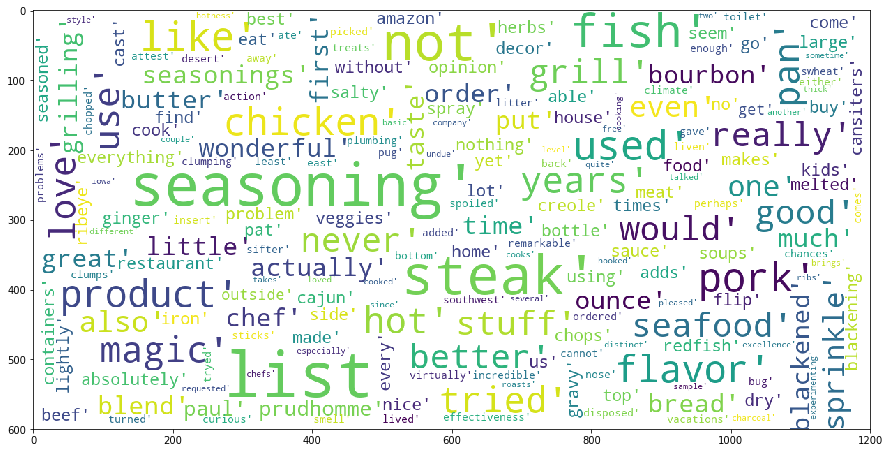

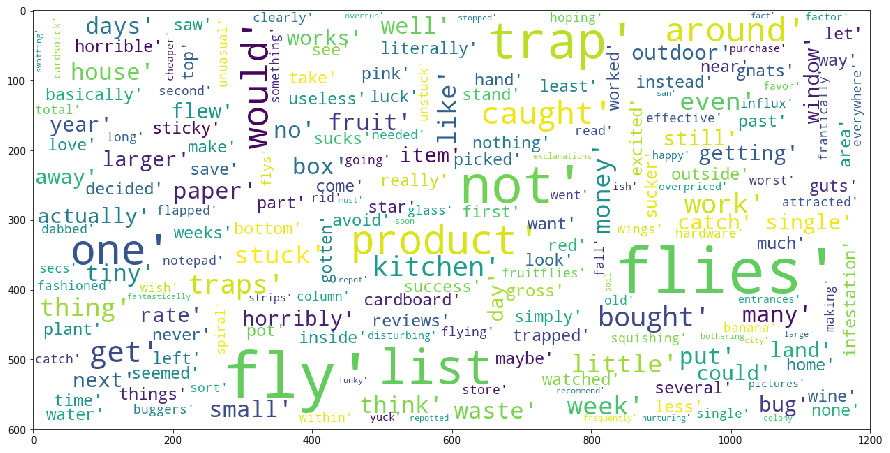

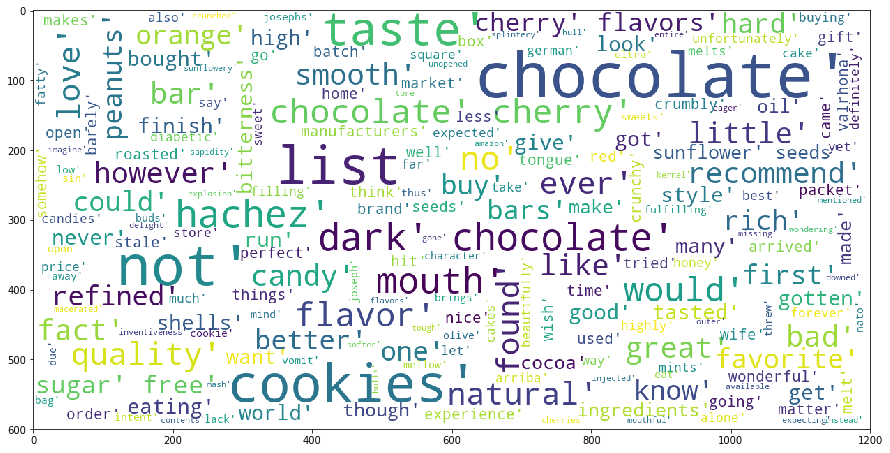

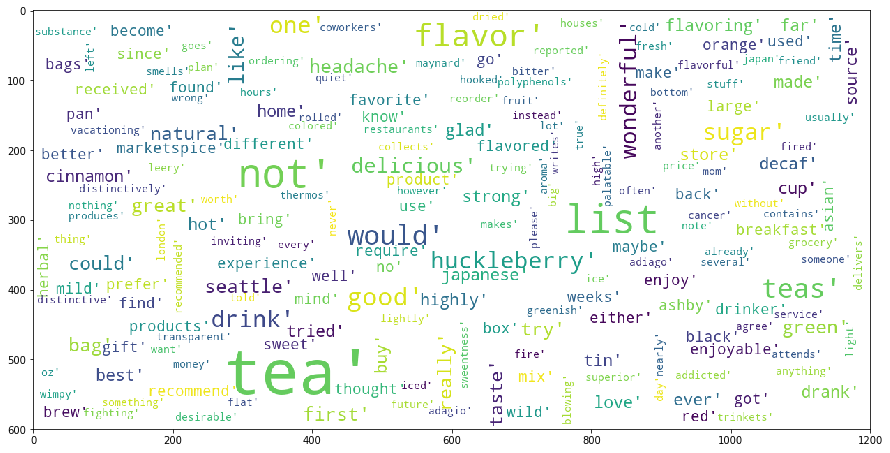

In [60]:
for k in range(0,10):
    create_word_cloud(np.array(tfidf_w2vec_list_of_sentance)[data_dict[k]],30,(15,8))

## [5.4] Applying KMeans on TFIDF W2V,<font color='red'> SET 4</font>

In [44]:
%time
# Unpickle AVG W2Vec Data
x = unpickle_data('avg_w2v.pkl')
inertia = []
k_val = []
for k in range(1,20):
    print('Cluster: {}'.format(k))
    kmeans = apply_kmeans_clustering(x,k)
    k_val.append(k)
    inertia.append(kmeans.inertia_)

Wall time: 0 ns
Cluster: 1
Cluster: 2
Cluster: 3
Cluster: 4
Cluster: 5
Cluster: 6
Cluster: 7
Cluster: 8
Cluster: 9
Cluster: 10
Cluster: 11
Cluster: 12
Cluster: 13
Cluster: 14
Cluster: 15
Cluster: 16
Cluster: 17
Cluster: 18
Cluster: 19


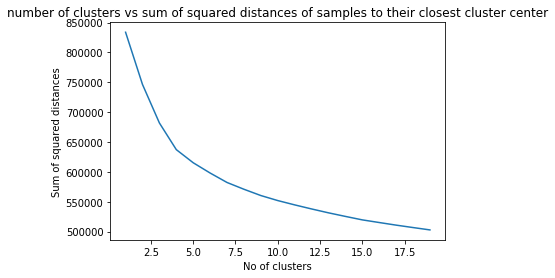

In [46]:
plot_elbow_curve(k_val, inertia, 'number of clusters vs sum of squared distances of samples to their closest cluster center','No of clusters', 'Sum of squared distances')

### From the above elbow curve we can take the number of clusters to be 10 as the metric doesn't vary too much after 10

In [47]:
# apply kemans with k=10
optimal_kmeans = KMeans(n_clusters=10)
optimal_kmeans.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [48]:
# get the index position of 20 words from each cluster
data_dict = {}
for k in range(0,10):
    data_dict[k] = np.where(optimal_kmeans.labels_ == k)[0][:20]

In [53]:
# get the BoW feature names
avg_w2vec_list_of_sentance=unpickle_data('avg_w2vec_list_of_sentance.pkl')

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

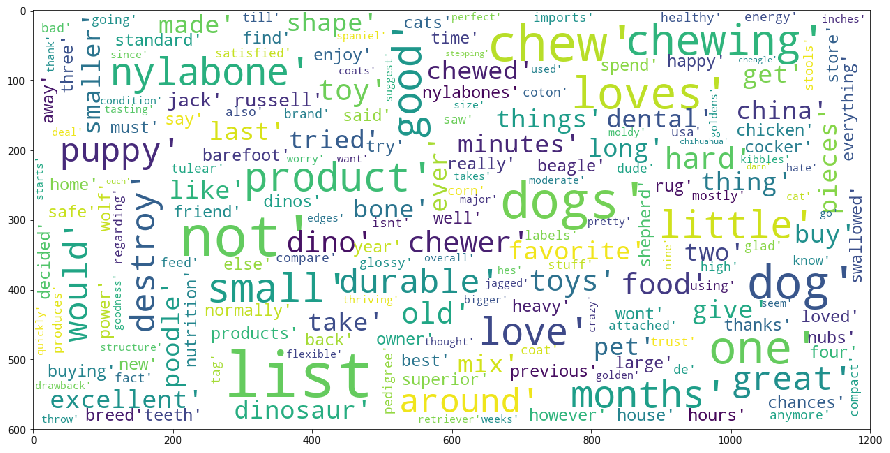

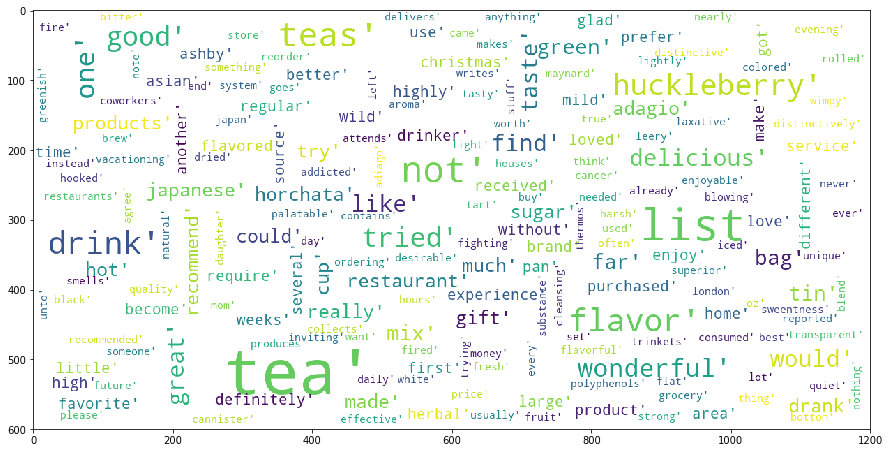

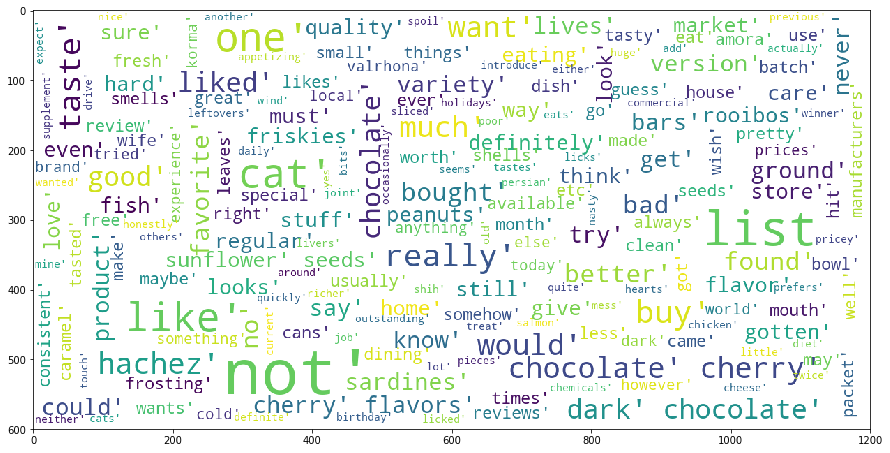

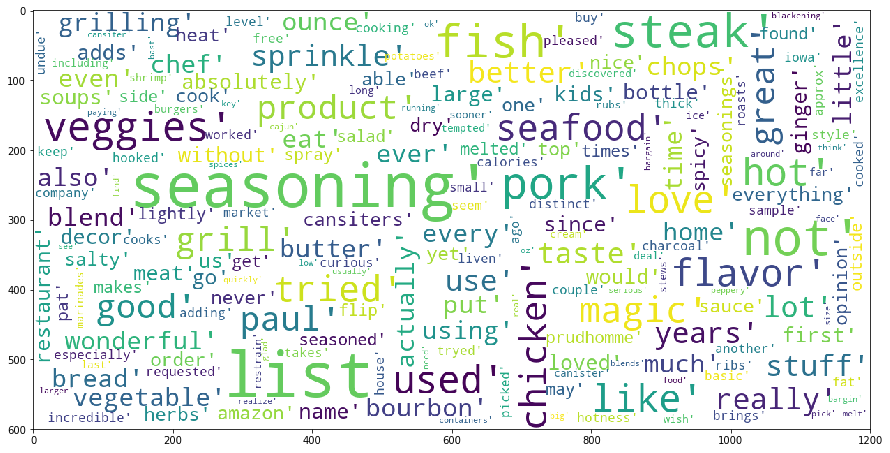

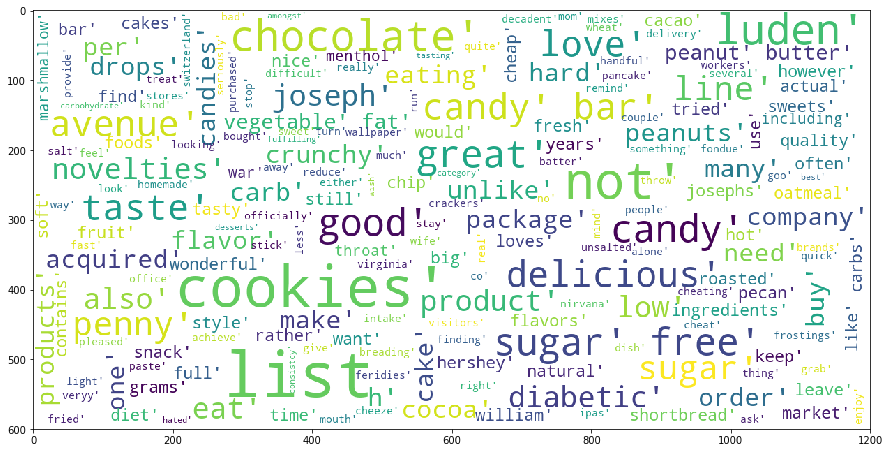

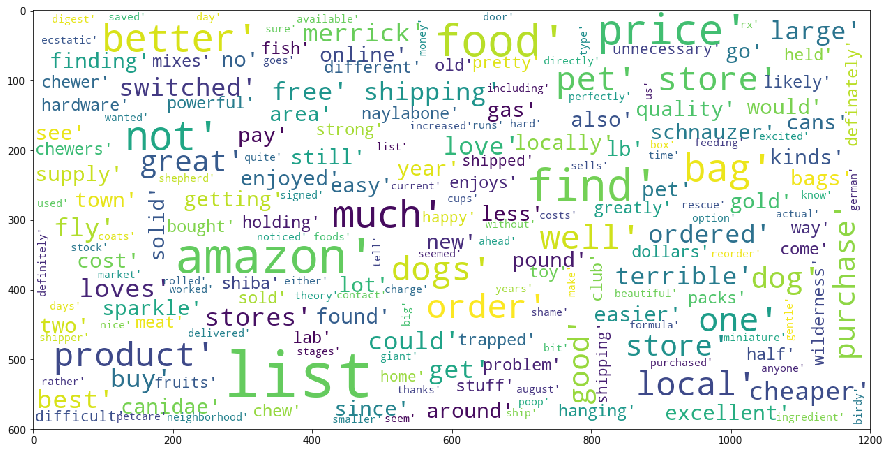

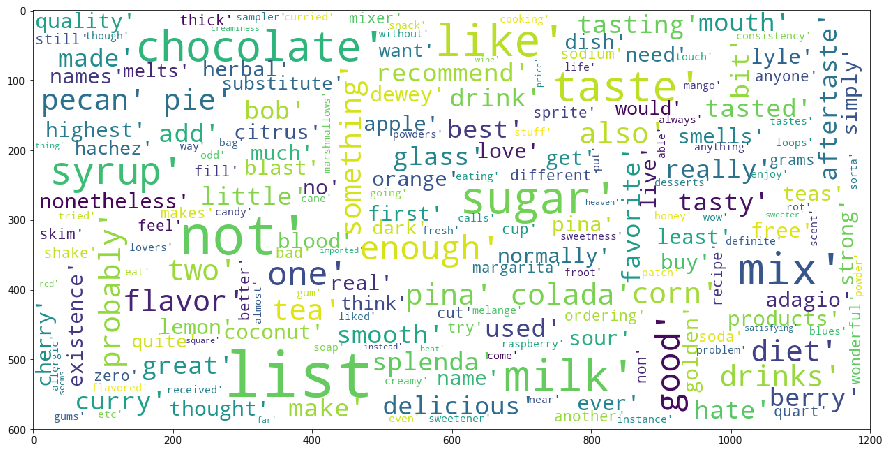

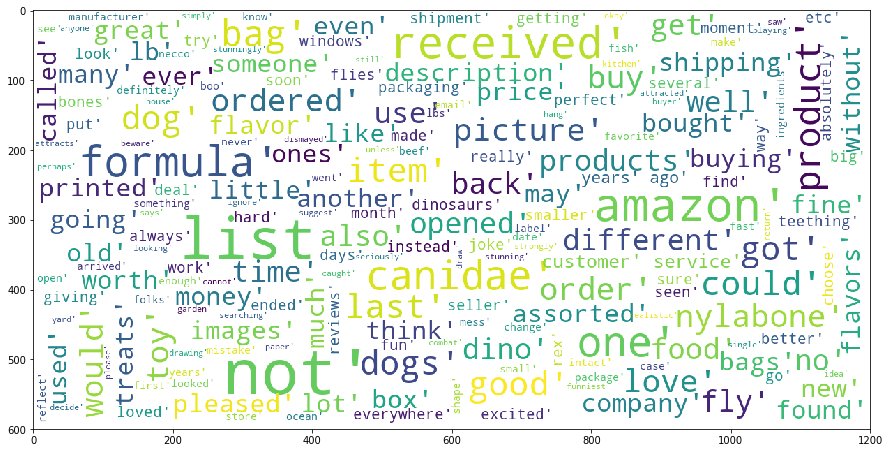

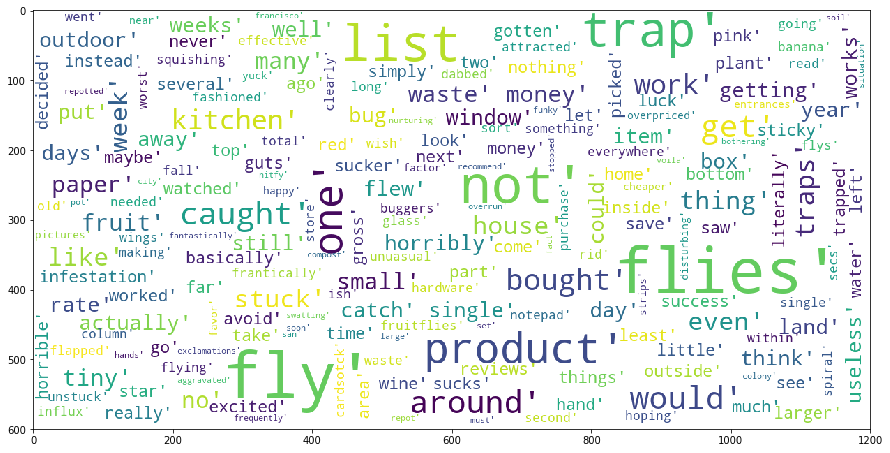

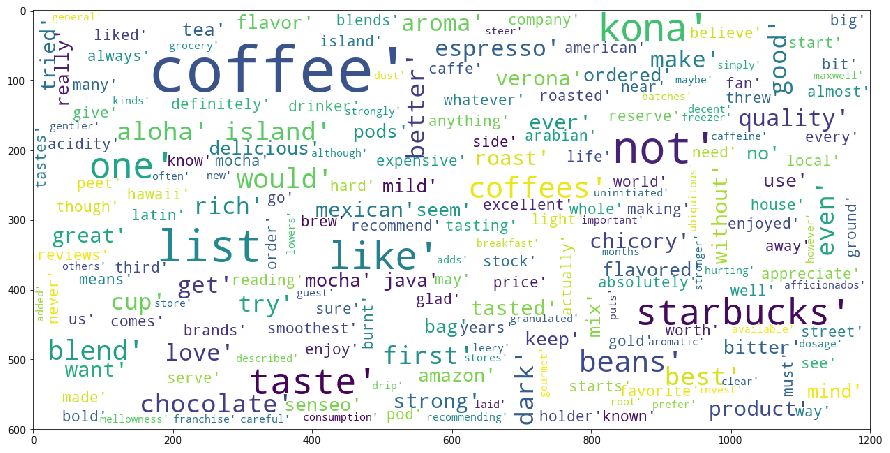

In [54]:
for k in range(0,10):
    create_word_cloud(np.array(avg_w2vec_list_of_sentance)[data_dict[k]],30,(15,8))

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [50]:
%time
# Unpickle AVG W2Vec Data
x = unpickle_data('avg_w2v_agglo_dbscan.pkl')
agglo2 = AgglomerativeClustering(n_clusters=2).fit(x)
agglo5 = AgglomerativeClustering(n_clusters=5).fit(x)

Wall time: 0 ns


### From the above elbow curve we can take the number of clusters to be 10 as the metric doesn't vary too much after 10

In [51]:
# get the index position of 20 words from each cluster
data_dict2 = {}
data_dict5 = {}
for k in range(0,2):
    data_dict2[k] = np.where(agglo2.labels_ == k)[0][:20]
for k in range(0,5):
    data_dict5[k] = np.where(agglo5.labels_ == k)[0][:20]

In [52]:
# get the BoW feature names
avg_w2vec_list_of_sentance=unpickle_data('avg_w2vec_list_of_sentance_agglo_dbscan.pkl')

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

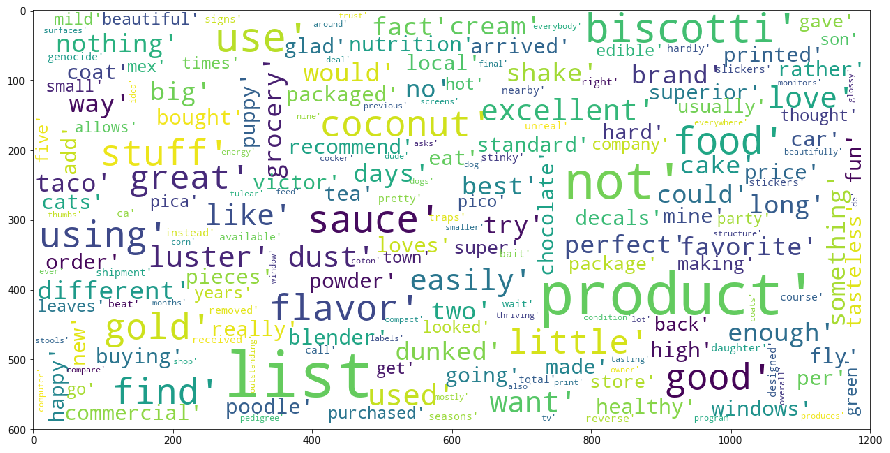

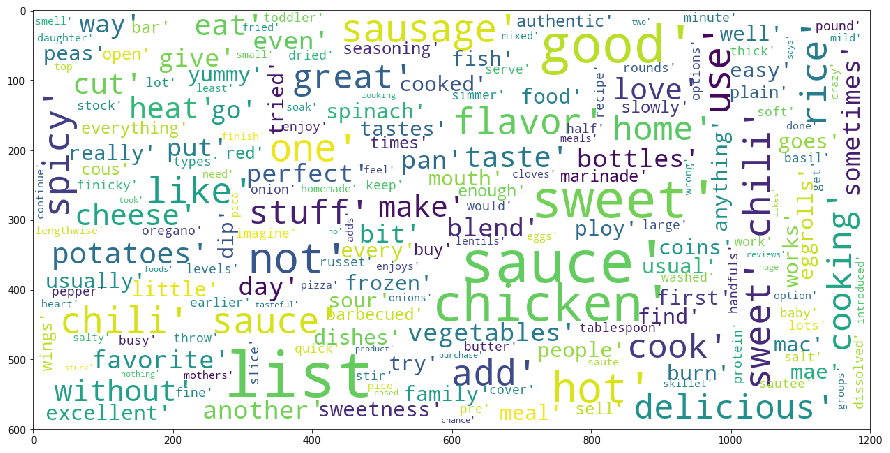

In [53]:
for k in range(0,2):
    create_word_cloud(np.array(avg_w2vec_list_of_sentance)[data_dict2[k]],30,(15,8))

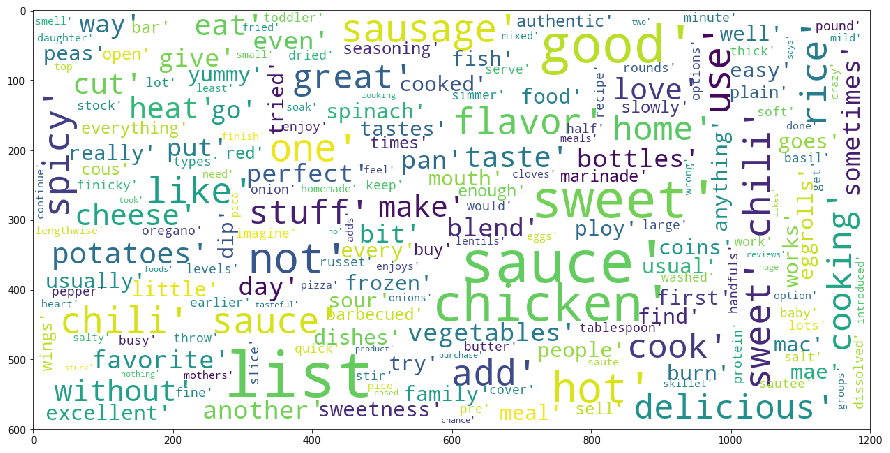

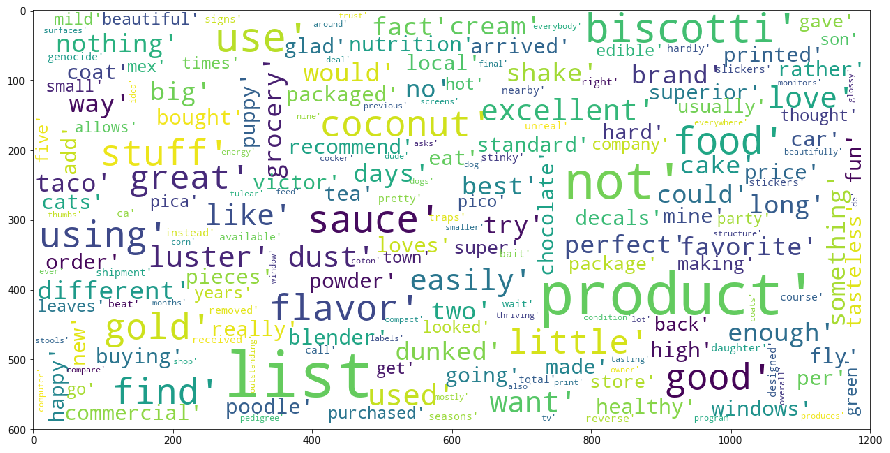

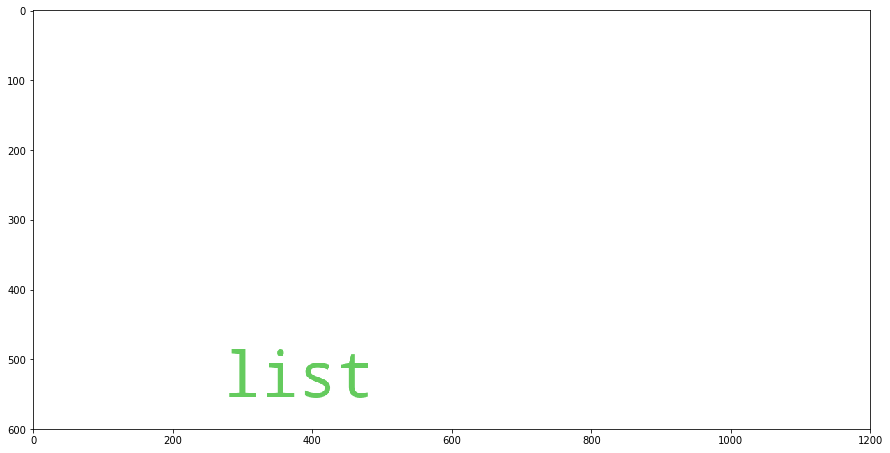

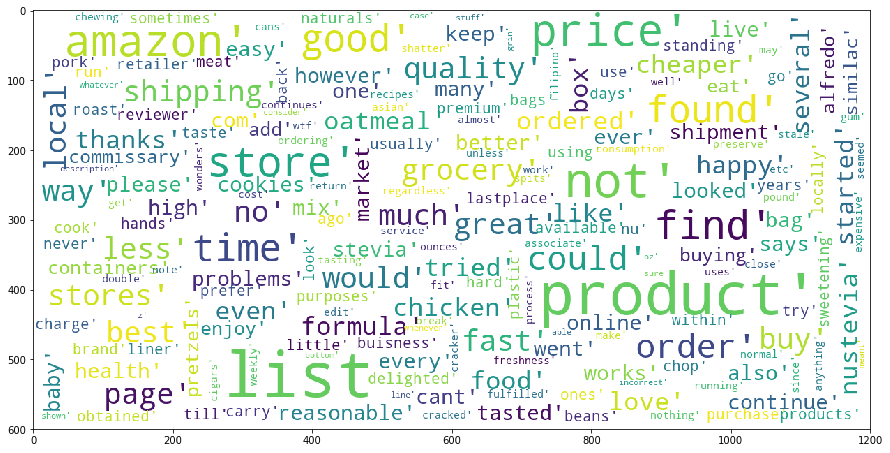

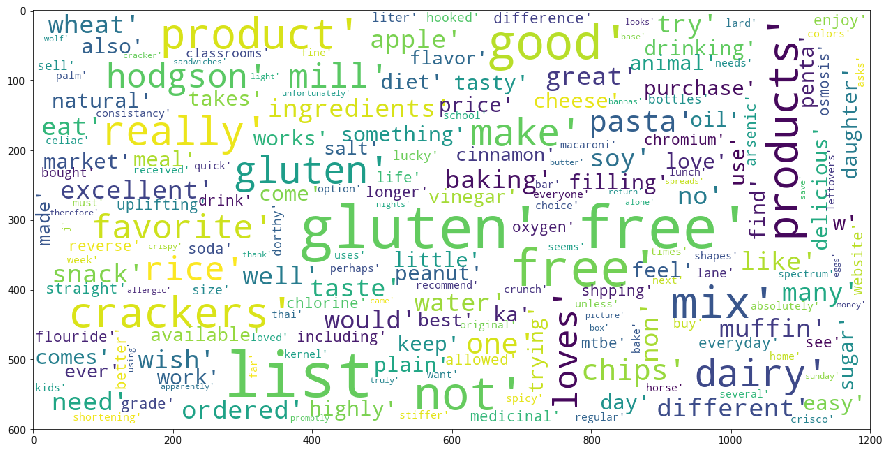

In [54]:
for k in range(0,5):
    create_word_cloud(np.array(avg_w2vec_list_of_sentance)[data_dict5[k]],30,(15,8))

## [5.4] Applying Agglomerative on TFIDF W2V,<font color='red'> SET 4</font>

In [55]:
%time
# Unpickle AVG W2Vec Data
x = unpickle_data('tfidf_w2v_agglo_dbscan.pkl')
agglo2 = AgglomerativeClustering(n_clusters=2).fit(x)
agglo5 = AgglomerativeClustering(n_clusters=5).fit(x)

Wall time: 0 ns


### From the above elbow curve we can take the number of clusters to be 10 as the metric doesn't vary too much after 10

In [56]:
# get the index position of 20 words from each cluster
data_dict2 = {}
data_dict5 = {}
for k in range(0,2):
    data_dict2[k] = np.where(agglo2.labels_ == k)[0][:20]
for k in range(0,5):
    data_dict5[k] = np.where(agglo5.labels_ == k)[0][:20]

In [57]:
# get the BoW feature names
tfidf_w2vec_list_of_sentance_agglo_dbscan=unpickle_data('tfidf_w2vec_list_of_sentance_agglo_dbscan.pkl')

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

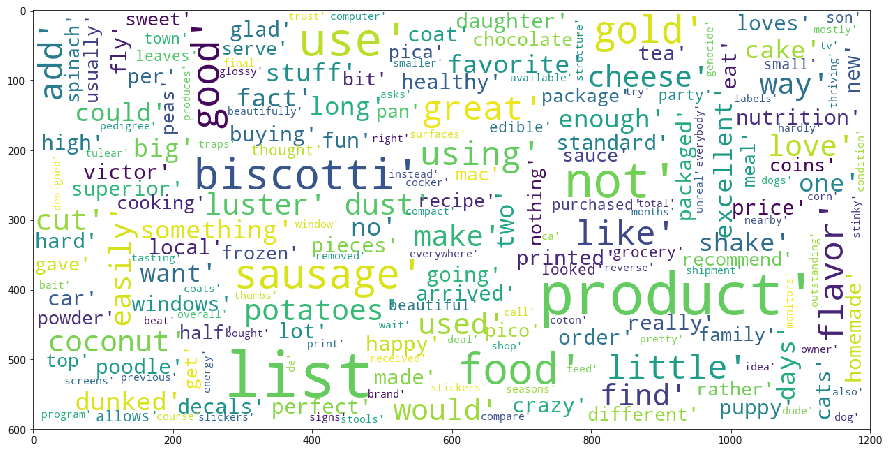

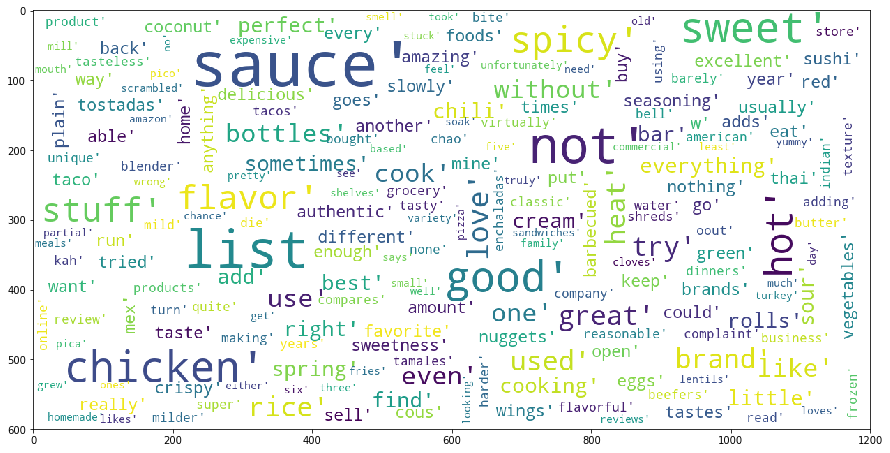

In [58]:
for k in range(0,2):
    create_word_cloud(np.array(tfidf_w2vec_list_of_sentance_agglo_dbscan)[data_dict2[k]],30,(15,8))

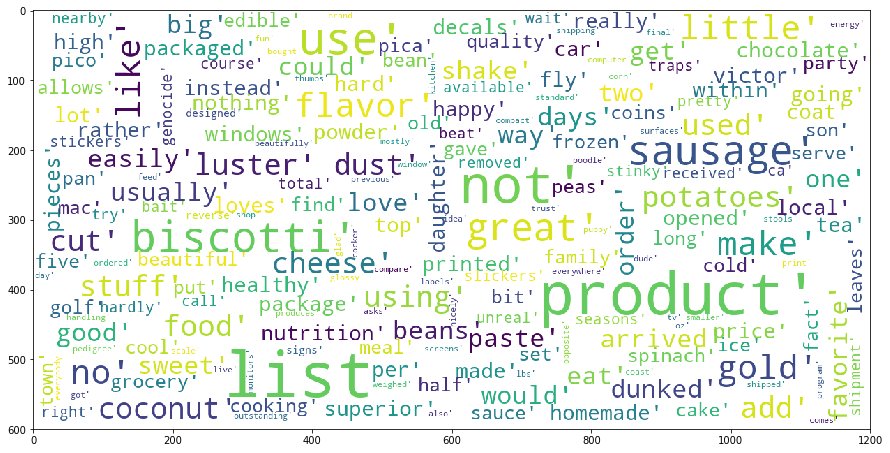

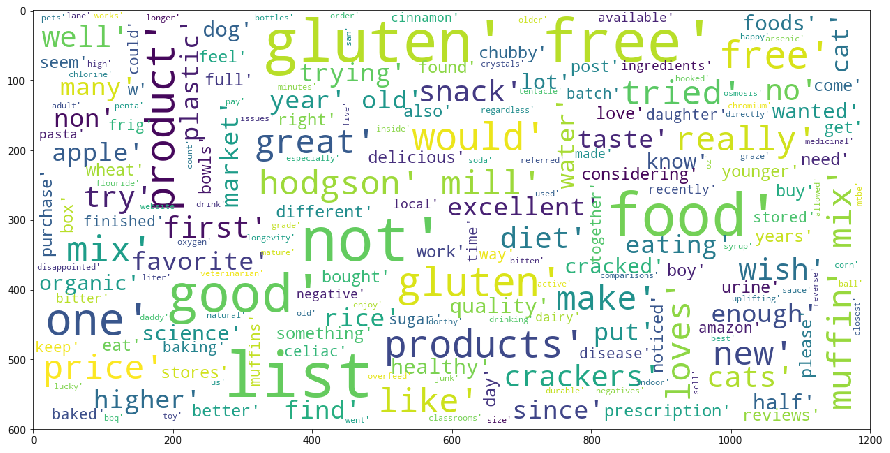

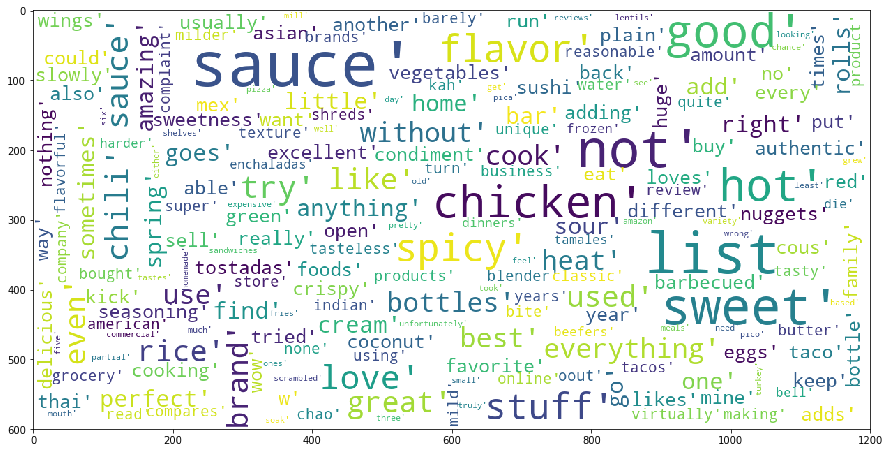

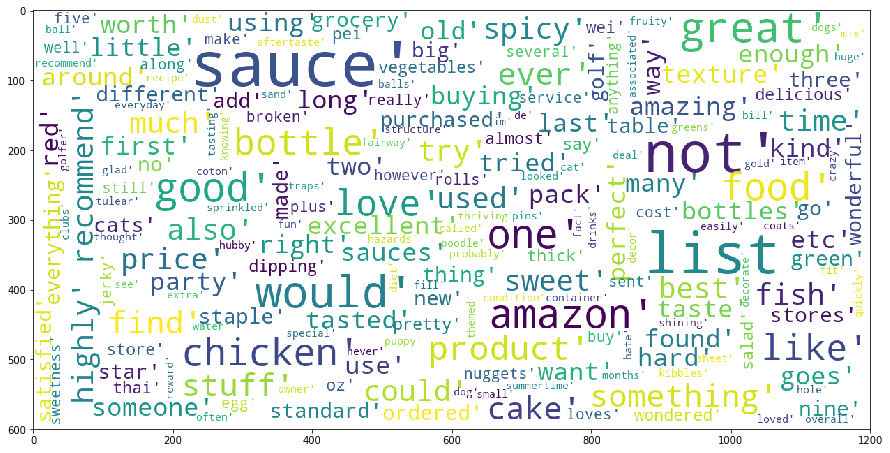

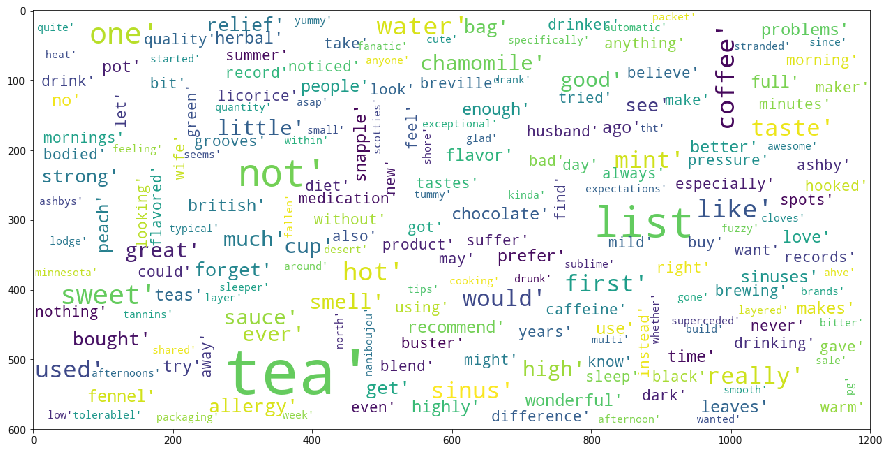

In [59]:
for k in range(0,5):
    create_word_cloud(np.array(tfidf_w2vec_list_of_sentance_agglo_dbscan)[data_dict5[k]],30,(15,8))

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [60]:
%time
# Unpickle AVG W2Vec Data
x = unpickle_data('avg_w2v_agglo_dbscan.pkl')
min_point = 100 #mean pts = 2*dimension
knn = NearestNeighbors(n_neighbors = min_point)
knn.fit(x)
dist , index = knn.kneighbors(x)

Wall time: 0 ns


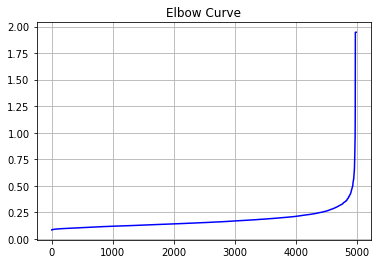

In [61]:
sort = sorted(dist[:,min_point-1])
plt.plot(list(range(1,len(x)+1)),sort,'b-')
plt.title('Elbow Curve')
plt.grid()
plt.show()

### From the elbow curve we can see the eps could be ~0.25

In [62]:
# Apply DBSCAN
db = DBSCAN(eps = 0.25 , min_samples = 100)
p = db.fit_predict(x)

In [63]:
# get the BoW feature names
avg_w2vec_list_of_sentance_agglo_dbscan=unpickle_data('avg_w2vec_list_of_sentance_agglo_dbscan.pkl')

In [64]:
index = []
for i in range(len(p)):
    if p[i] == 0:
        index.append(i)

text = []
for i in range(len(index)):
    text.append(avg_w2vec_list_of_sentance_agglo_dbscan[index[i]])

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

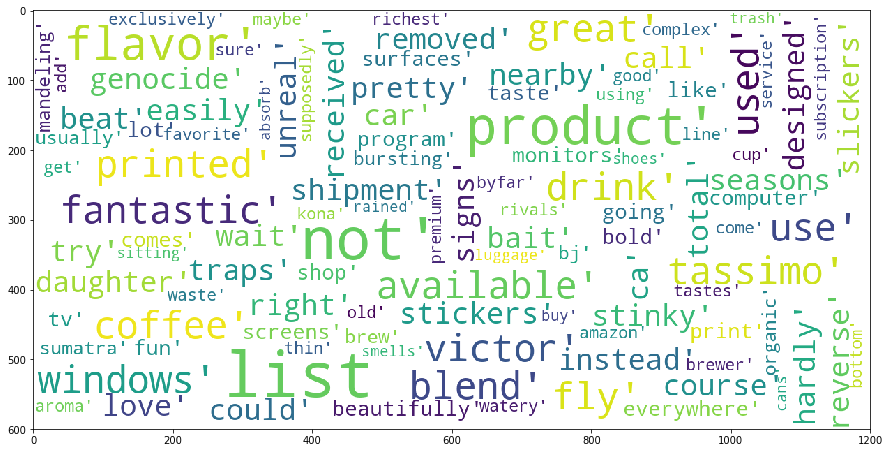

In [65]:
create_word_cloud(np.array(text),30,(15,8))

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [66]:
%time
# Unpickle AVG W2Vec Data
x = unpickle_data('tfidf_w2v_agglo_dbscan.pkl')
min_point = 100 #mean pts = 2*dimension
knn = NearestNeighbors(n_neighbors = min_point)
knn.fit(x)
dist , index = knn.kneighbors(x)

Wall time: 0 ns


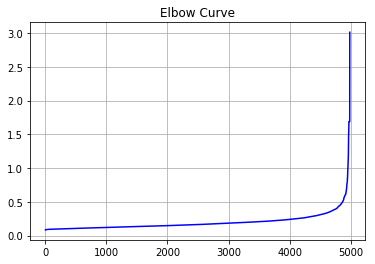

In [67]:
sort = sorted(dist[:,min_point-1])
plt.plot(list(range(1,len(x)+1)),sort,'b-')
plt.title('Elbow Curve')
plt.grid()
plt.show()

### From the elbow curve we can see the eps could be ~0.5

In [68]:
# Apply DBSCAN
db = DBSCAN(eps = 0.5 , min_samples = 100)
p = db.fit_predict(x)

In [69]:
# get the BoW feature names
tfidf_w2vec_list_of_sentance_agglo_dbscan=unpickle_data('tfidf_w2vec_list_of_sentance_agglo_dbscan.pkl')

In [70]:
index = []
for i in range(len(p)):
    if p[i] == 0:
        index.append(i)

text = []
for i in range(len(index)):
    text.append(tfidf_w2vec_list_of_sentance_agglo_dbscan[index[i]])

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

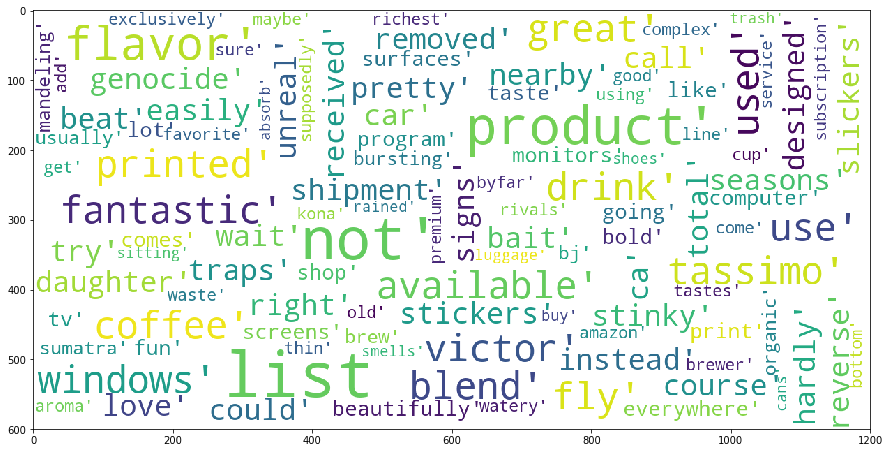

In [71]:
create_word_cloud(np.array(text),30,(15,8))

# [6] Conclusions

### [1]. From the dataset (Amazon fine food review) we can say that there are basically 2 types (clusters) are     there positive and negative based on the ratings given
### [2]. In the clustering alogorithm, it divides the data set into many clusters having togetherness.
### [3]. From all the word-clouds we can see that most of the similar words are clustered in each clusters.
### [4]. Some food items like : food, cake, baked etc. are there in same clusters.
### [5]. One important thing is to notice that as Word2Vec is a very powerful model for word embedding and word analogy, that on those clusters we can see words having similar meaning or analogy of those words are very equivalent